In [1]:
from utils import data_loader
from utils import model

import numpy as np

from tqdm import tqdm
from skimage.io import imread
from skimage.transform import resize
from skimage.metrics import structural_similarity, peak_signal_noise_ratio

from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
from utils.heat_map import HeatMap
from utils.game_metrics import GAME_metric
config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)

2022-12-06 00:28:52.608761: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
/home/lbbduy/anaconda3/envs/master_python/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2022-12-06 00:28:53.287983: I tensorflow/compiler/jit/xla_gpu_device.cc:99] Not creating XLA devices, tf_xla_enable_xla_devices not set
2022-12-06 00:28:53.288507: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2022-12-06 00:28:53.316483: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-06 00:28:53.316828: I tensorflow/core/common_runtime/gpu/gpu_device.cc:172

In [2]:
BATCH_SIZE = 1
BATCH_SAMPLE_SIZE = 64

dataset_dict = data_loader.load_dataset_paths(dataset_name='final_data', validation_split_size=0.0)

test_input_data = dataset_dict['test']['images']
test_output_data = dataset_dict['test']['density_maps']

test_dataset, test_size = data_loader.load_dataset(
    input_paths=test_input_data,
    output_paths=test_output_data,
    output_type='density_maps',
    batch_size=BATCH_SIZE,
    shuffle=False,
    downsampling_size=2,
    buffer_size=1
)

2022-12-06 00:28:56.107713: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2022-12-06 00:28:56.107962: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-06 00:28:56.108372: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: NVIDIA GeForce RTX 2080 Ti computeCapability: 7.5
coreClock: 1.545GHz coreCount: 68 deviceMemorySize: 10.76GiB deviceMemoryBandwidth: 573.69GiB/s
2022-12-06 00:28:56.108417: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
2022-12-06 00:28:56.108435: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.11
2022-12-06 00:28:56.108443: I tensorflow/stream_executor/plat

In [3]:
test_size

1301

In [4]:
model_pretrained = model.load_pretrained_model('./model_checkpoints/model_WNet_NoBN_checkpoint_12_05_2022_013501.h5')

In [22]:
estimation_pred = []
estimation_true = []
ssim_scores = []
psnr_scores = []
for _, data in tqdm(
        enumerate(test_dataset),
        total=len(test_dataset)
):
    dm_pred = np.squeeze(model_pretrained.predict(data[0])[0], axis=-1)
    dm_true = np.squeeze(data[1][0].numpy(), axis=-1)
    data_range=dm_pred.max() - dm_pred.min()

    ssim_scores.append(structural_similarity(dm_true, dm_pred, data_range=data_range))
    psnr_scores.append(peak_signal_noise_ratio(dm_true, dm_pred, data_range=data_range))
    estimation_true.append(np.sum(dm_true))
    estimation_pred.append(np.sum(dm_pred))

100%|██████████| 1301/1301 [01:05<00:00, 19.91it/s]


In [23]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
mse = mean_squared_error(estimation_true, estimation_pred)
mae = mean_absolute_error(estimation_true, estimation_pred)

In [24]:
print('Mean Absolute Error: {}'.format(mae))
print('Mean Square Error: {}'.format(mse))
print('SSIM: {}'.format(np.average(ssim_scores)))
print('PSNR: {}'.format(np.average(psnr_scores)))

Mean Absolute Error: 3.6760263442993164
Mean Square Error: 36.099693298339844
SSIM: 0.9185114950050525
PSNR: 26.316165976199766


2022-12-05 23:56:27.413074: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:116] None of the MLIR optimization passes are enabled (registered 2)
2022-12-05 23:56:27.430966: I tensorflow/core/platform/profile_utils/cpu_utils.cc:112] CPU Frequency: 3686400000 Hz
2022-12-05 23:56:27.586372: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudnn.so.8
2022-12-05 23:56:28.519210: W tensorflow/stream_executor/gpu/asm_compiler.cc:63] Running ptxas --version returned 256
2022-12-05 23:56:28.552848: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] Internal: ptxas exited with non-zero error code 256, output: 
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.
2022-12-05 23:56:29.424548: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.11
2022-12-05 23:56:29.657357: I tensorflow/stream

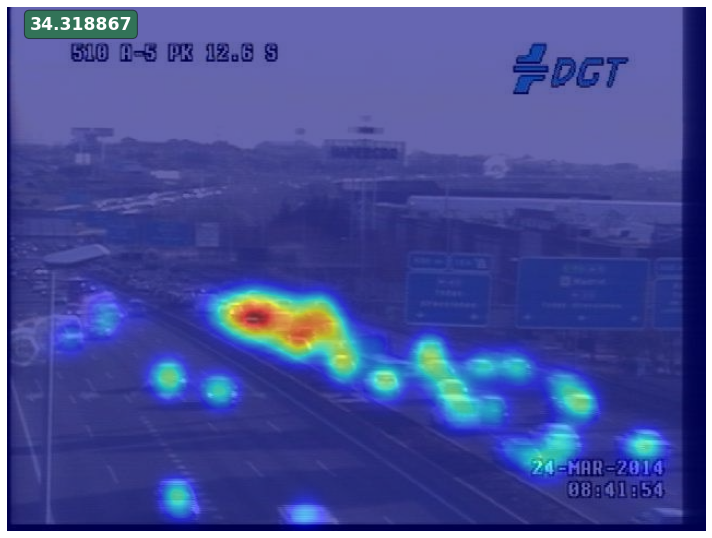

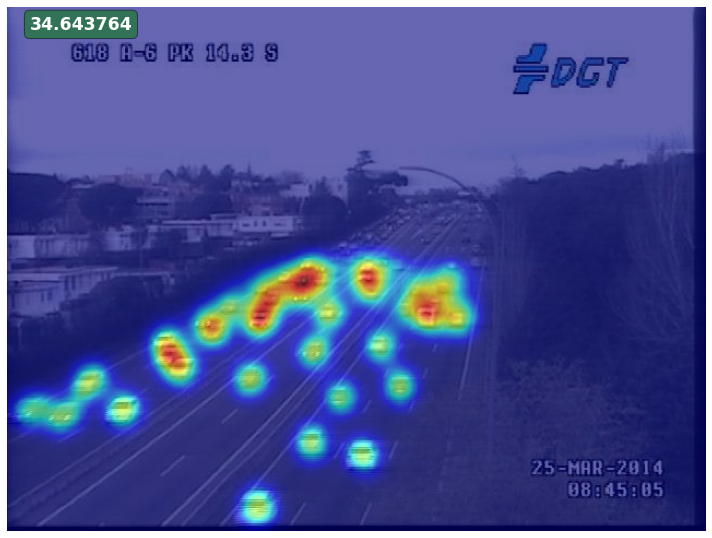

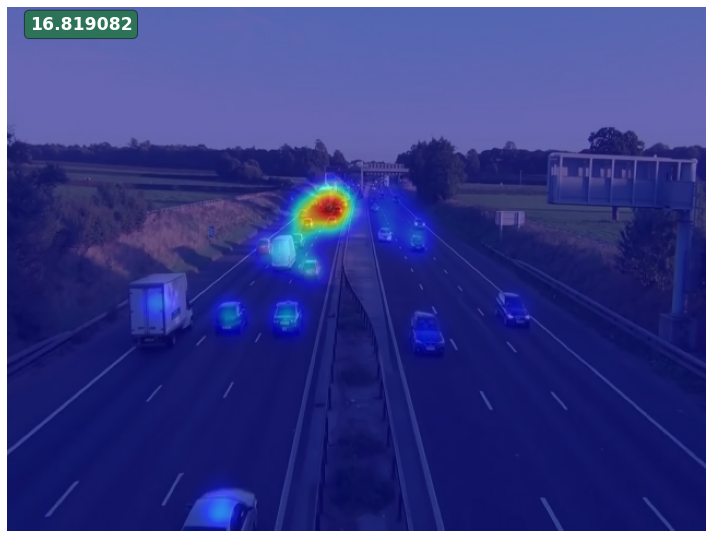

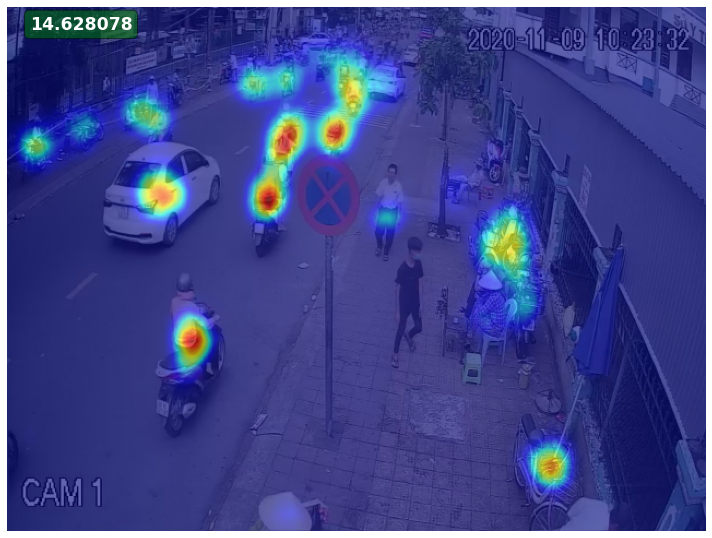

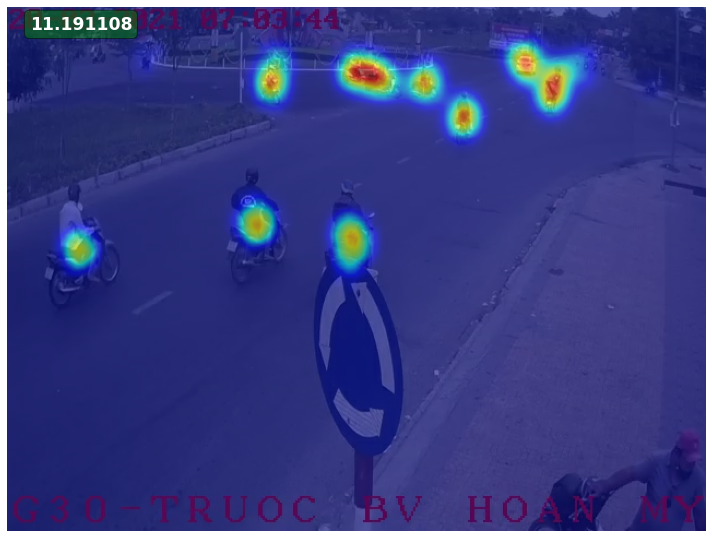

...

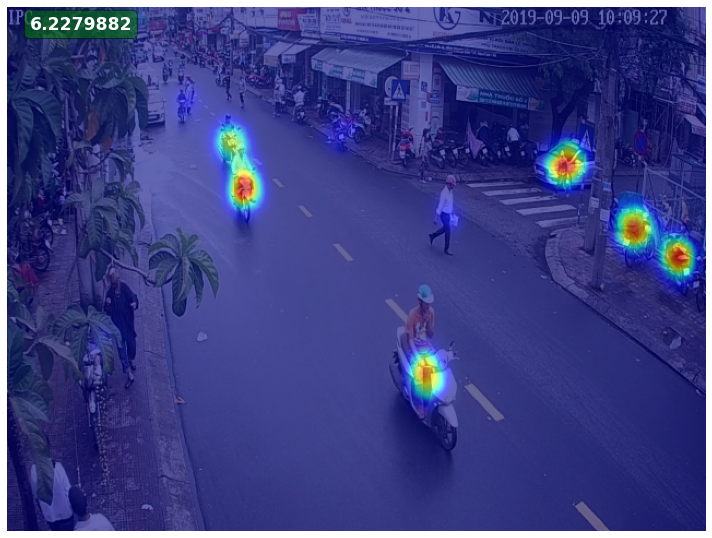

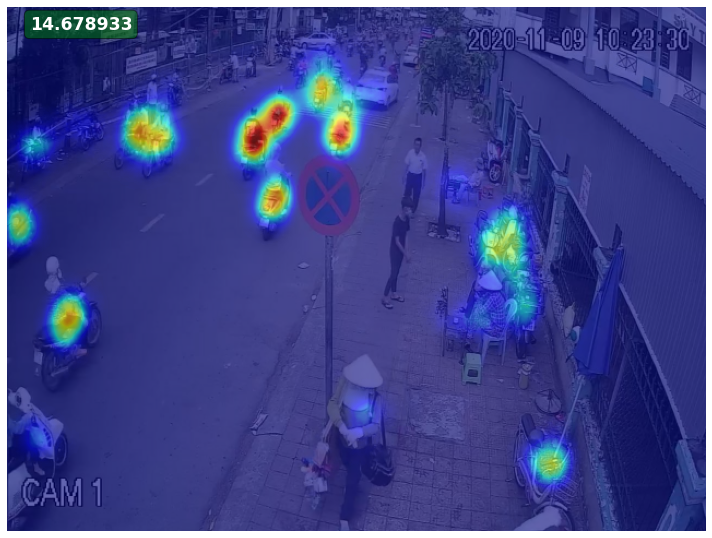

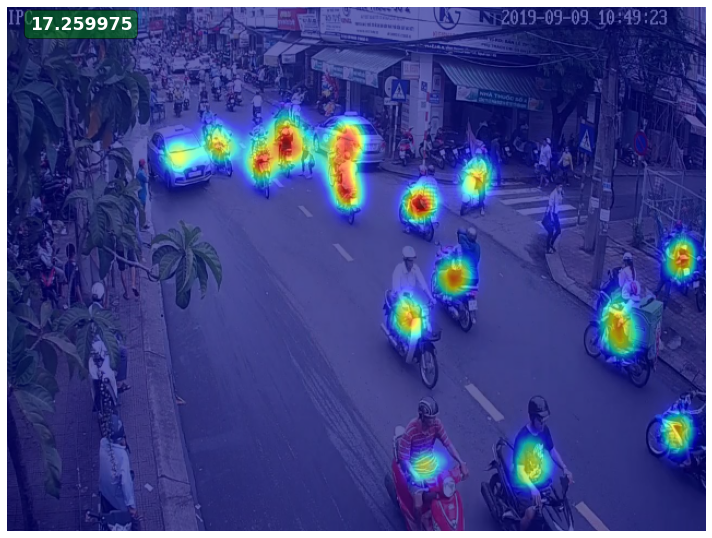

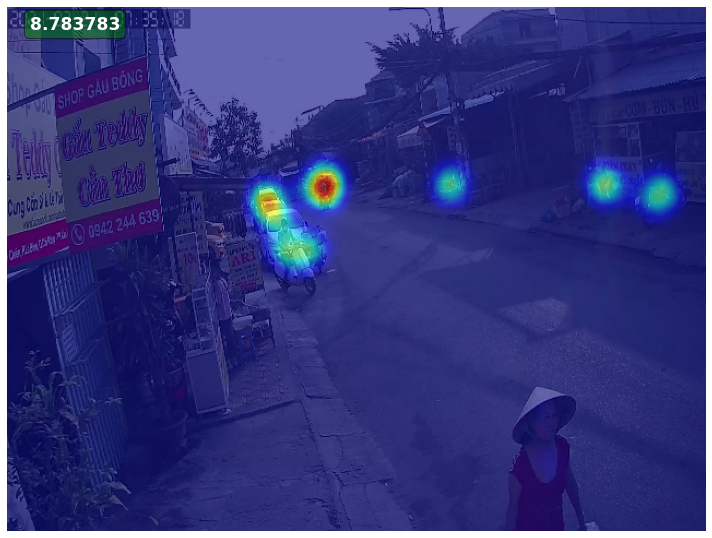

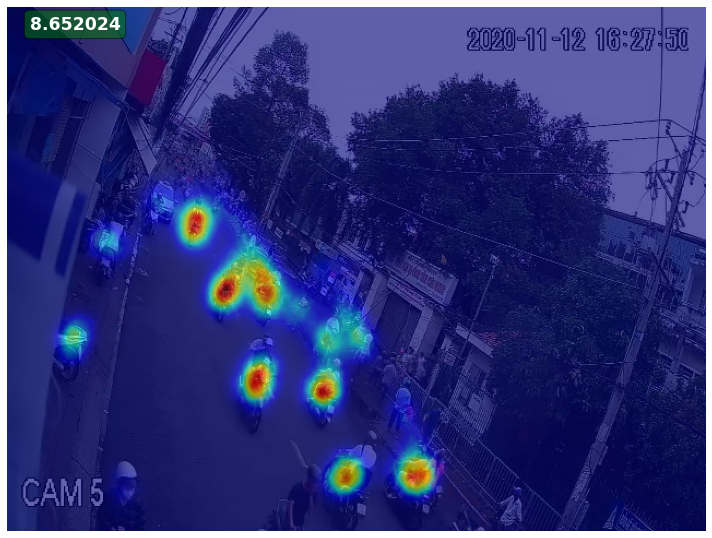

In [5]:
for image, density_map in test_dataset.take(20):
    img_plot = image.numpy()
    img_plot = (img_plot * 255).astype(np.uint8)

    pred_density_map = model_pretrained.predict(image)

    estimation = np.sum(pred_density_map)
    hm = HeatMap(img_plot[0] , pred_density_map[0], gaussian_std=0)
    hm.plot(transparency=0.6, color_map='jet', text=str(estimation))